In [13]:
from pathlib import Path
import os

from astropy.nddata import CCDData
from astropy.visualization import hist
from astropy.stats import mad_std

import ccdproc as ccdp
import matplotlib.pyplot as plt
import numpy as np
import sys
from astropy import units as u


sys.path.append("/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline")
import fpnfix
from aperturePhot import showimage as show_image

In [14]:
path = "/home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/"
day = "20211101"
path_day = os.path.join(path, day)

data_red = Path(path_day, "Reduced_Images")
data_red.mkdir(exist_ok = True)

In [15]:
files = ccdp.ImageFileCollection(path_day)
files.summary['file', 'imagetyp', 'filter', 'exptime', 'naxis1', 'naxis2']

file,imagetyp,filter,exptime,naxis1,naxis2
str31,str11,object,float64,int64,int64
Ast2_001V.fit,Light Frame,Bessel V,60.0,1024,1024
Ast2_002V.fit,Light Frame,Bessel V,60.0,1024,1024
Ast2_003V.fit,Light Frame,Bessel V,60.0,1024,1024
Ast2_004V.fit,Light Frame,Bessel V,60.0,1024,1024
Ast2_005V.fit,Light Frame,Bessel V,60.0,1024,1024
Ast2_006V.fit,Light Frame,Bessel V,60.0,1024,1024
Ast2_007V.fit,Light Frame,Bessel V,60.0,1024,1024
Ast2_008V.fit,Light Frame,Bessel V,60.0,1024,1024
Asteroid2_001V.fit,Light Frame,Bessel V,60.0,1024,1024


In [16]:
calibrated_biases = files.files_filtered(imagetyp='Bias Frame', include_path=True)

combined_bias = ccdp.combine(calibrated_biases,
                             method='median',
                             sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                             sigma_clip_func=np.ma.median, sigma_clip_dev_func=mad_std, unit = "adu")

combined_bias.meta['combined'] = True

combined_bias.write(os.path.join(data_red / 'combined_bias.fit'), overwrite = True)

In [17]:
calibrated_darks = files.files_filtered(imagetyp='Dark Frame', include_path=True)
reduced_darks= []
exptime= []

for frame in calibrated_darks:
    image = ccdp.CCDData.read(frame, unit = 'adu')
    exptime.append(image.header["exposure"])
    reduced_darks.append(ccdp.subtract_bias(image, combined_bias))
    
combined_darks = ccdp.combine(reduced_darks,
                             method='median',
                             sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                             sigma_clip_func=np.ma.median, sigma_clip_dev_func=mad_std, unit = "adu", scale =1 / np.array(exptime))

combined_darks.header["exposure"] = 1
combined_darks.header['exptime'] = 1

combined_darks.meta['combined'] = True

combined_darks.write(os.path.join(data_red / 'combined_darks.fit'), overwrite = True)

24.6769270641462 230.64830801669365
-662.3654753993088 967.5942747817378


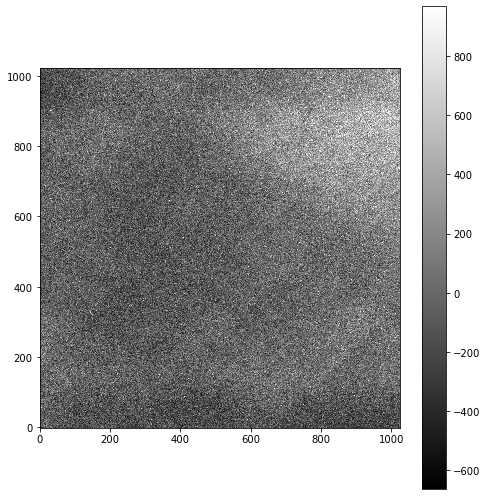

In [18]:
import fpnfix
import ccdproc
import aperturePhot as ap


os.chdir(path_day)
combfpn = fpnfix.buildFPNFrame(files, redpath = "./Reduced_Images", darkim = "combined_darks.fit") #Note this assumes that the SO Darks were taken as 'Light Frame' 
                                       #with OBJECT='SODark' - use imagetyp and object keyword arguments 
                                       #to change this if needed
                                       
#Show the combined FPN frame build from 60 second SO Darks               
ap.showimage(combfpn[60])

In [19]:
flat_imagetyp = 'Flat Field'

flat_filters = set(h['filter'] for h in files.headers(imagetyp=flat_imagetyp))
flat_filters

{'Bessel B', 'Bessel R', 'Bessel V'}

Before image 
22406.563102777796 205.45129500000107
21158.268477652942 22972.766666666666


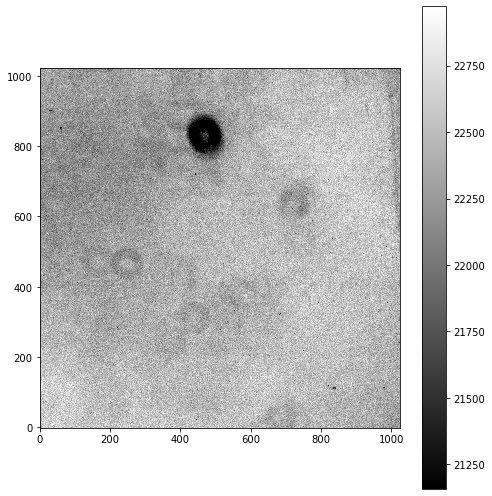

intercept, slope = -1.8222403402233414 0.10590754365869033


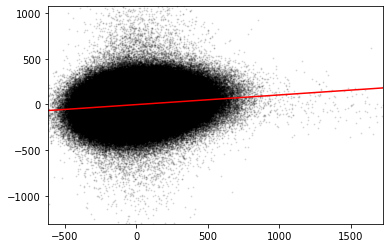

Corrected image
22403.94963004739 200.11754200358817
21188.16329777052 22936.22573266627


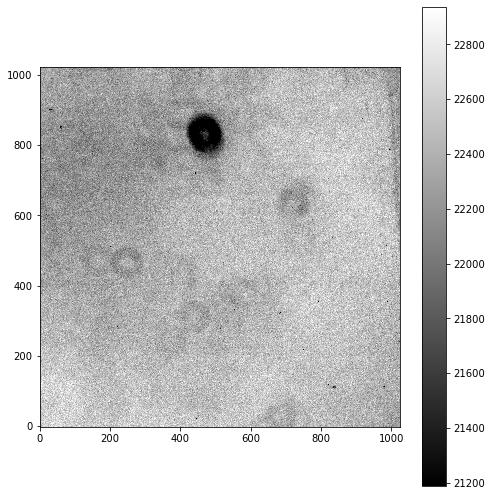

Before image 
22768.72215753396 209.19485999999785
21557.164637904738 23405.675


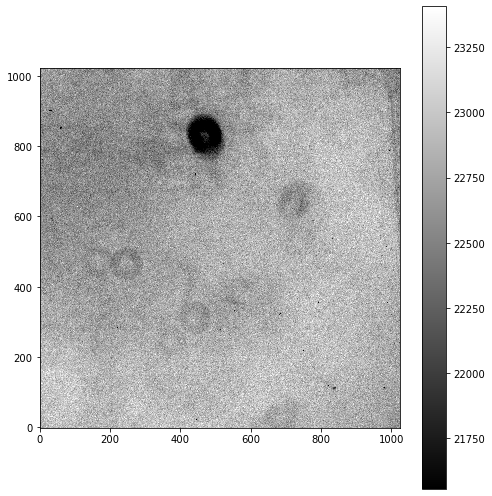

intercept, slope = -1.5707667426066052 0.10484437001984262


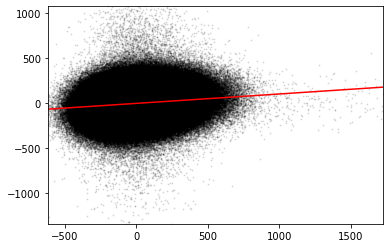

Corrected image
22766.134920661898 205.87279848621748
21588.68688246971 23385.24446634831


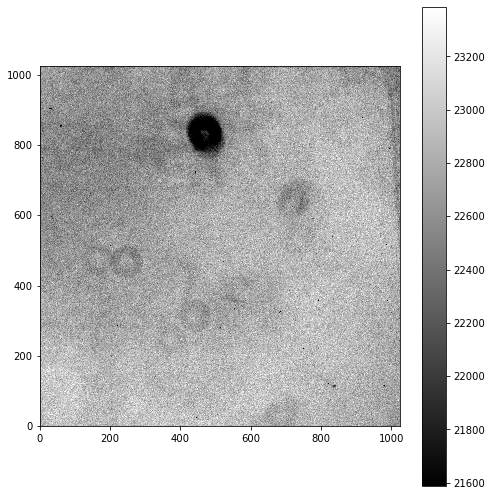

Before image 
22791.145529802638 205.896075
21561.66626931079 23478.083333333332


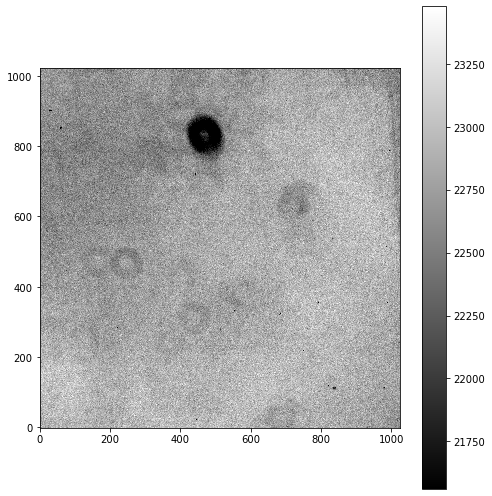

intercept, slope = -1.4868168471042922 0.10158611627192388


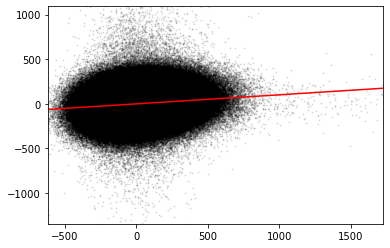

Corrected image
22788.638696620656 202.4115357478343
21577.229934738625 23481.173519613603


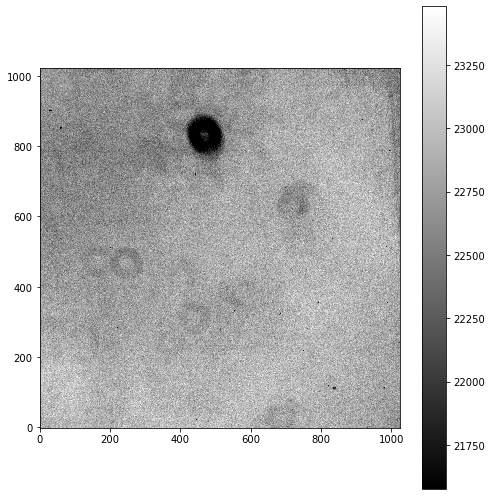

Before image 
22780.799103792506 208.41649500000108
21535.404507824 23471.266666666666


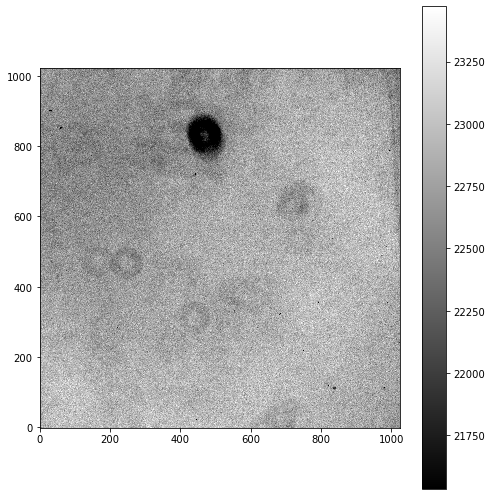

intercept, slope = -1.7468250959673897 0.09073216461511775


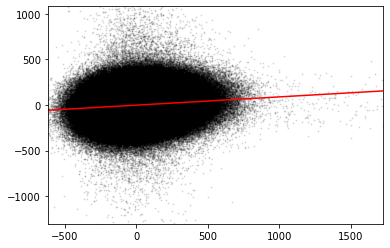

Corrected image
22778.560112783936 205.62518194558865
21560.931549379173 23472.840150077995


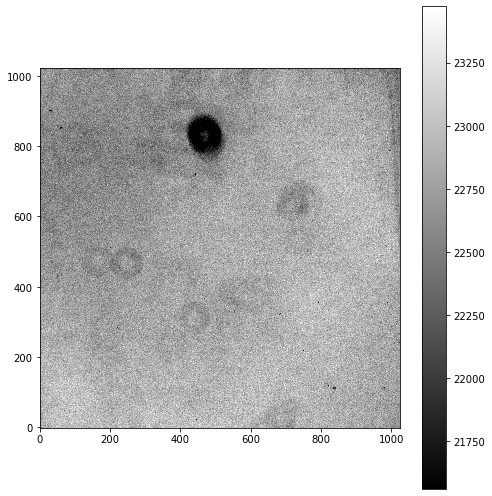

Before image 
22851.572727258997 206.60031000000322
21613.488577939497 23432.741666666665


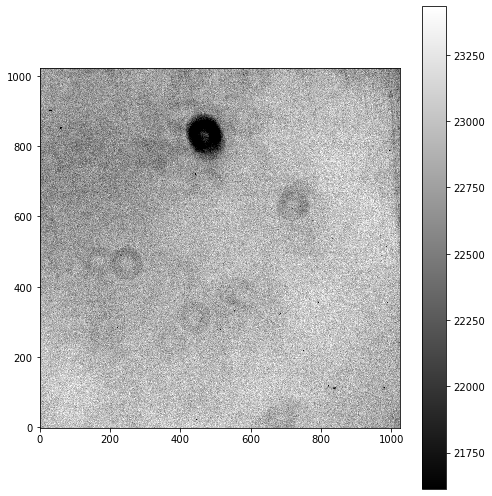

intercept, slope = -1.598104661921568 0.09640212008290022


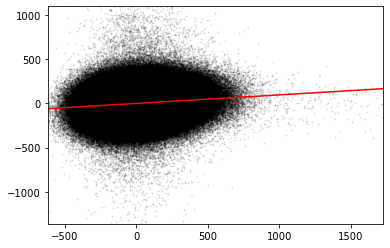

Corrected image
22849.1938191729 203.41063145615198
21632.15183613148 23435.868127724665


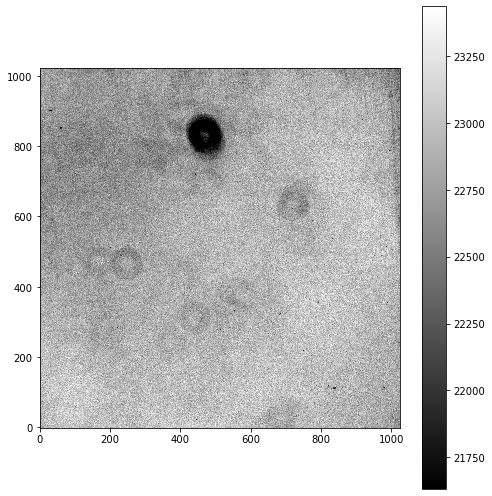

Before image 
27687.727456092834 360.2718
25633.599691175208 28883.0


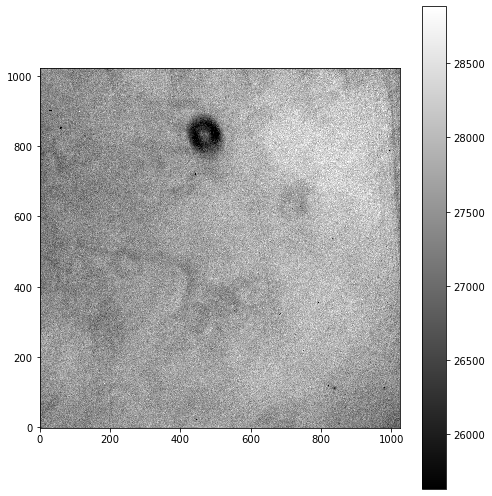

intercept, slope = -4.441295289295323 0.5359454127767886


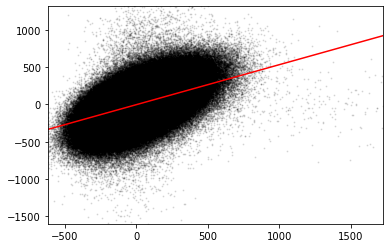

Corrected image
27674.501970231377 301.59259552719016
25970.937347094125 28547.685857442175


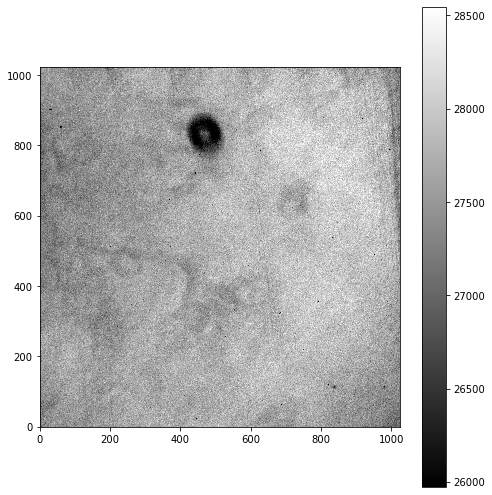

Before image 
27657.716777801514 355.82399999999996
25641.1171144547 28714.0


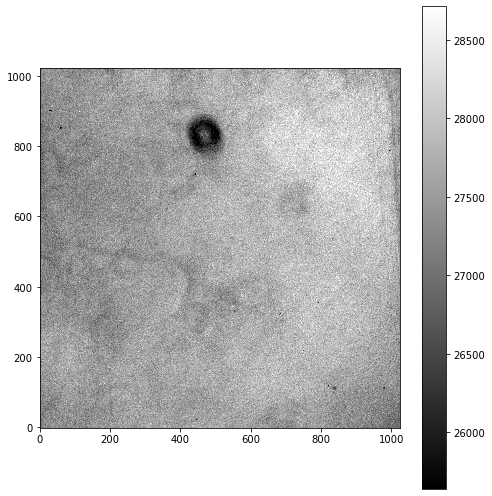

intercept, slope = -3.945312948354568 0.49415941324660395


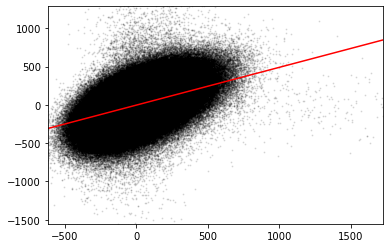

Corrected image
27645.522442002773 302.44639947842626
25945.94528931476 28493.226748817295


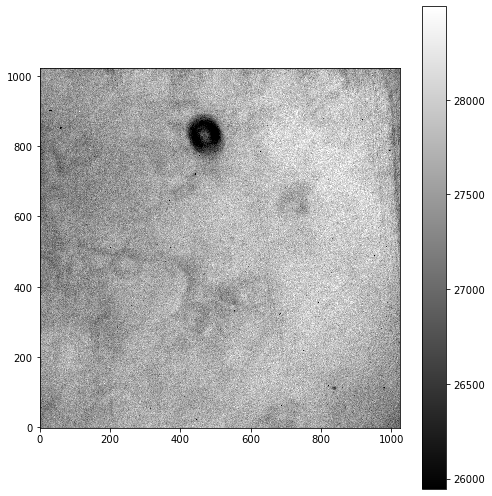

Before image 
27698.593000411987 358.7892
25617.12672932031 28861.0


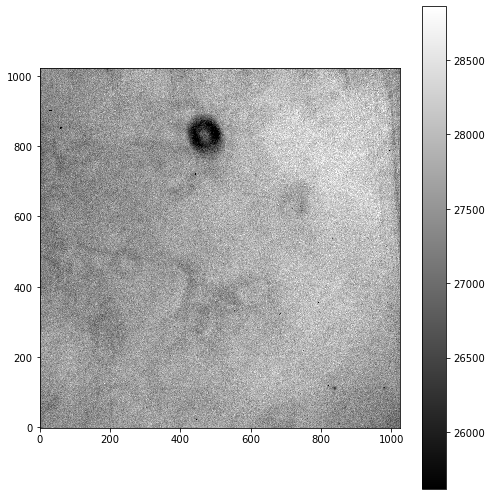

intercept, slope = -4.231277755867394 0.49923041912114424


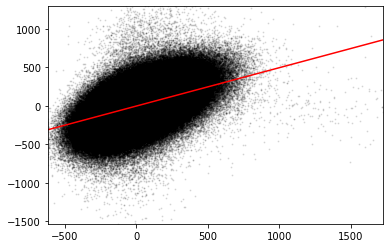

Corrected image
27686.27352777114 304.65378109298155
25932.52130905726 28650.918235407236


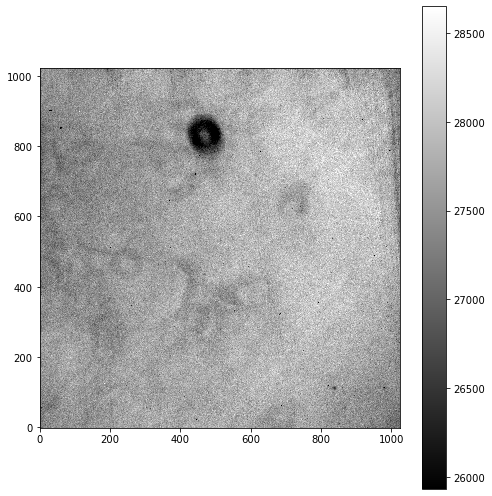

Before image 
27033.115621566772 357.3066
24937.756765411308 28008.0


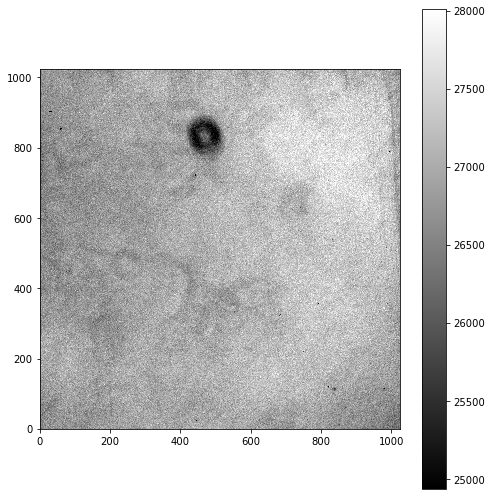

intercept, slope = -4.072116272517541 0.5267703446647231


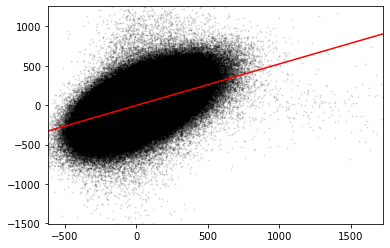

Corrected image
27020.116548191934 297.6950166304125
25298.466495394514 27812.50720808341


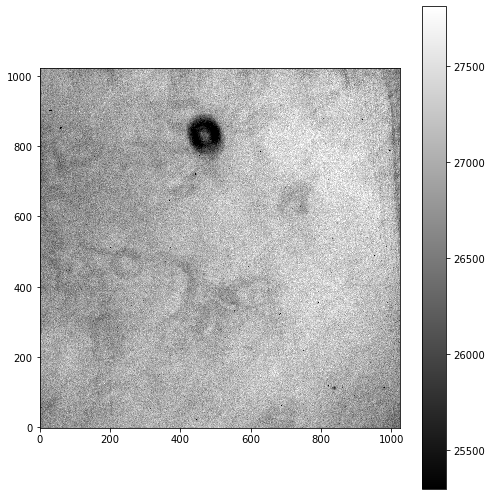

Before image 
31590.675044552492 309.17152000000465
29757.22321528762 32653.283333333333


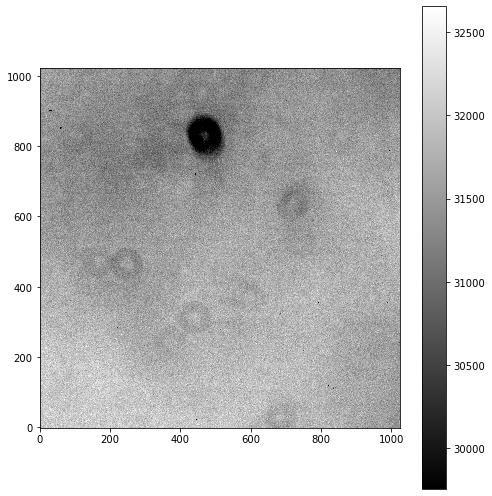

intercept, slope = -0.09539591345211337 0.043249768597719666


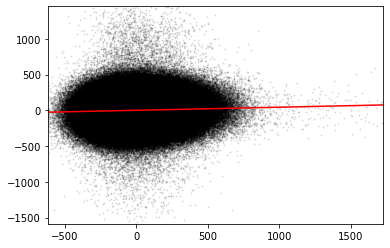

Corrected image
31589.60777316726 310.8499372576174
29757.003092807146 32654.6859862747


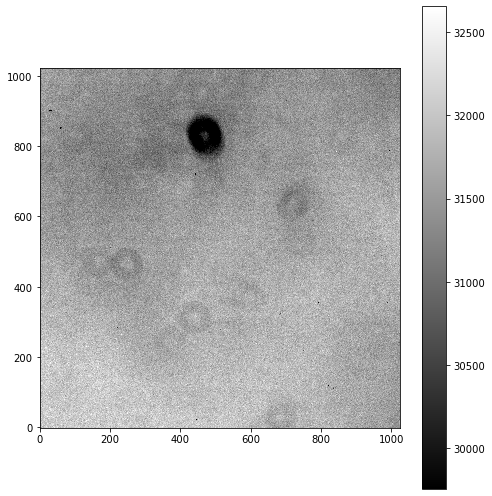

Before image 
31725.923399464296 308.5784799999971
29889.456072527184 32735.283333333333


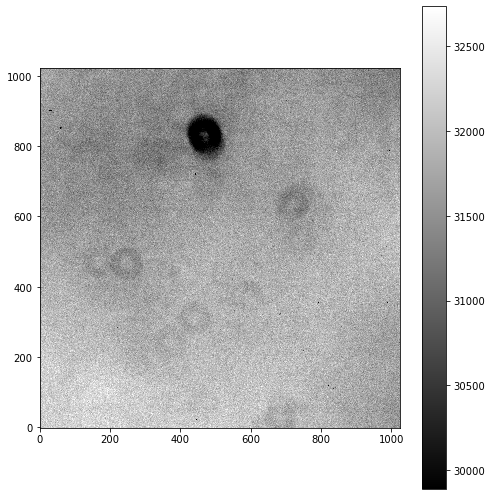

intercept, slope = 0.07887467248679286 0.04271348842230539


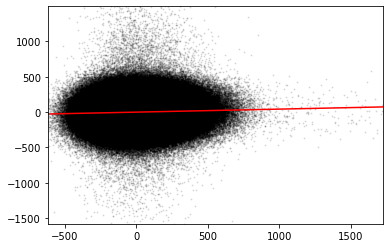

Corrected image
31724.86936182586 309.978518028679
29888.805900586325 32736.66859392811


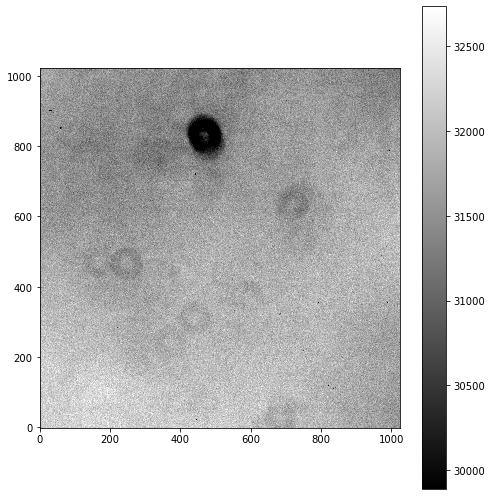

Before image 
31729.739449040102 313.409285000005
29873.337743783344 32977.28333333333


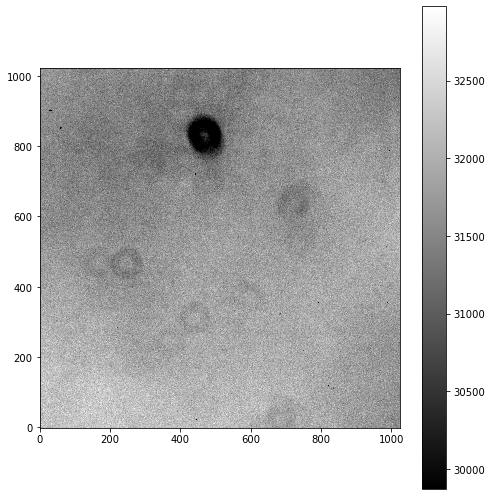

intercept, slope = -0.018022235940933284 0.04206750111023583


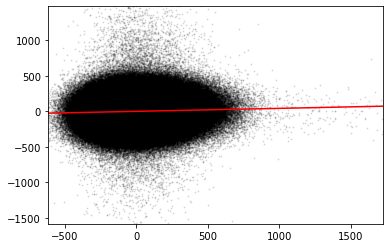

Corrected image
31728.701352383414 314.7697931397957
29859.98172275097 32978.647643619406


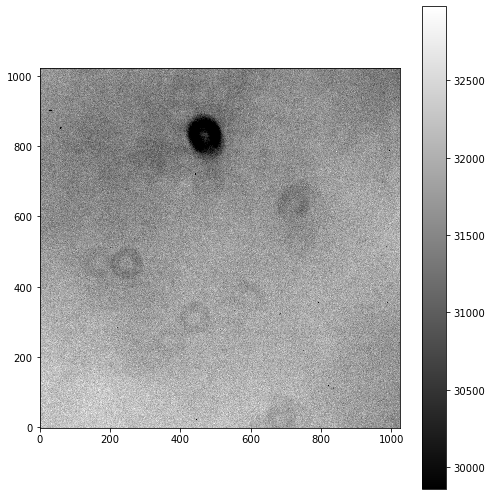

Before image 
31850.769011036562 313.2733800000043
30014.6179973784 33147.28333333333


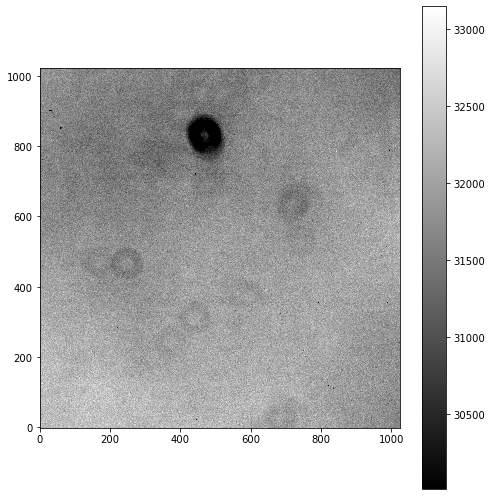

intercept, slope = -0.1618614513241226 0.043316825256498874


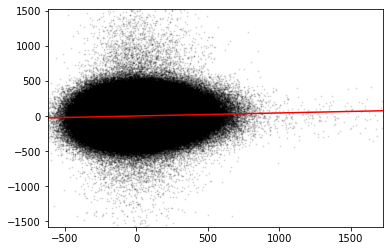

Corrected image
31849.700084899057 314.7338283264304
30007.840457128266 33148.68816101974


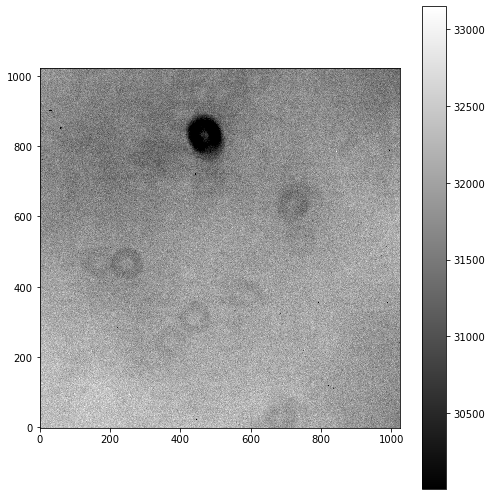

In [20]:
scale = lambda a: 1/np.median(a)

master_flats = {}

for filt in flat_filters:
    reduced_flats = []
    calibrated_flats = files.files_filtered(imagetyp = flat_imagetyp, filter = filt, include_path=True)
    
    for flat in calibrated_flats:
        image = ccdp.CCDData.read(flat, unit = "adu")
        image = ccdp.subtract_bias(image, combined_bias)
        image = ccdp.subtract_dark(image, combined_darks, scale=True, exposure_unit=u.s, exposure_time = "exptime")
        image = fpnfix.subtract_fpn(image,combfpn[60],mesh_size=32, verbose = 2)
        reduced_flats.append(image)
    
    combined_flats = ccdp.combine(reduced_flats,
                                 method='median',
                                 sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                                 sigma_clip_func=np.ma.median, signma_clip_dev_func=mad_std, unit = "adu", scale = scale
                                )

    master_flats[filt]=combined_flats.copy()

    combined_flats.write(data_red / (filt.replace("","_")+"_combined_flats.fit"), overwrite = True)

2280.4026827812195 5.1891
2263.5 2298.0


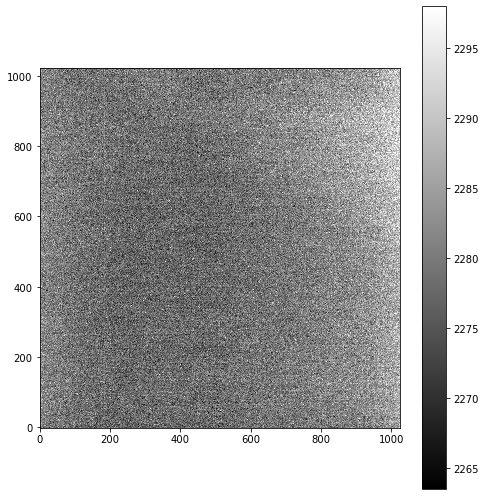

In [21]:
show_image(combined_bias)

5.114559642473854 1.82854
1.4166666666666665 15.013719263766745


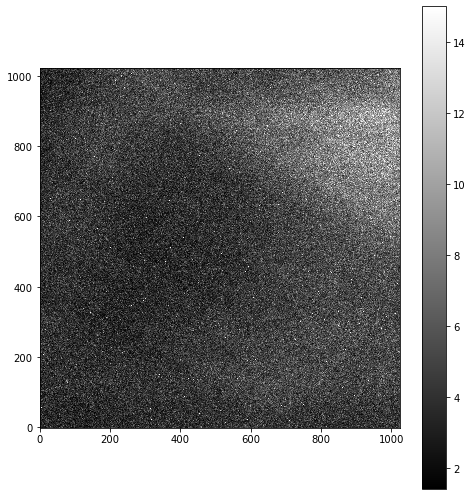

In [22]:
show_image(combined_darks)

0.9992344338577303 0.007700339050604838
0.9538157737427985 1.0245011436525242


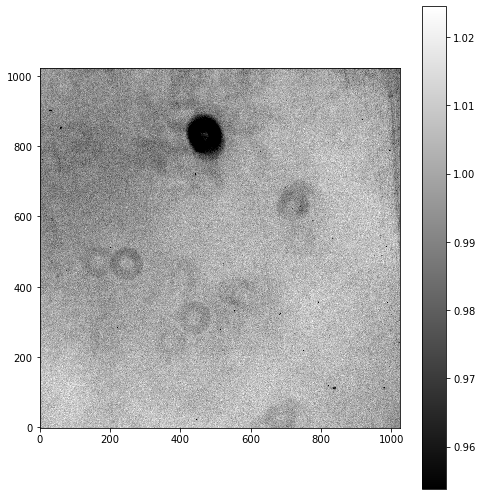

0.9996052231209009 0.010262155995460449
0.9413703729768971 1.0259513273502168


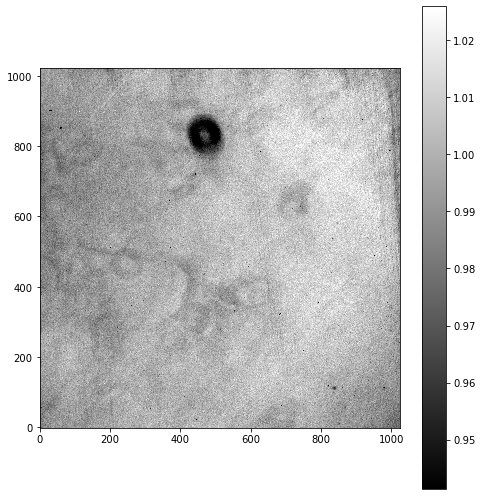

0.9995660070223669 0.00915459460514147
0.9457010669422968 1.0361165424231542


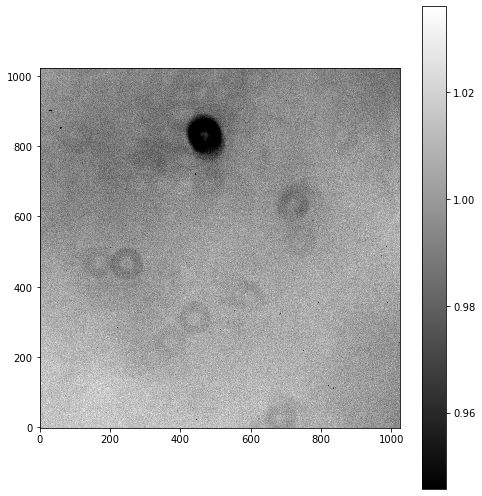

In [23]:
for filt,image in master_flats.items():
    show_image(image)

In [24]:
images = files.files_filtered(imagetyp="Light Frame", include_path = True)

for image in images:
    var = ccdp.CCDData.read(image, unit = "adu")
    var_filt = var.header["filter"]
    
    corr_filt = master_flats[var_filt]
    
    var = ccdproc.ccd_process(var,
                             master_bias = combined_bias, dark_frame = combined_darks,
                             master_flat = corr_filt, exposure_key="exposure", exposure_unit = u.second,
                             dark_scale = True)
    proc_data = os.path.basename(image)
    var.write(data_red / ("BDF_"+proc_data), overwrite = True)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
254.95225526592856 31.39840850908193
170.57889165311732 378.3733200799


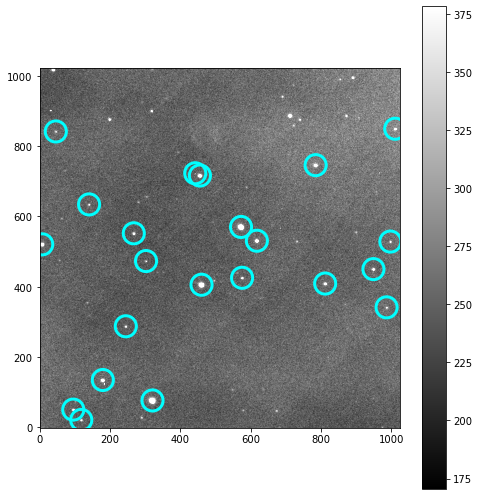

      xcentroid   ycentroid       mag
2    320.405926   76.619307 -4.566641
15   572.309546  570.251442 -4.170109
6    459.916628  405.789533 -3.993853
11     6.610385  520.756151 -2.370313
17   455.356319  716.520763 -2.214530
13   617.391892  531.037748 -2.183669
19   784.572121  746.029190 -2.168419
3    179.104421  134.812251 -1.958745
7    811.724959  409.173126 -1.596917
9    949.045495  450.265496 -1.456830
14   267.187897  552.181112 -0.957684
1     94.996115   50.583258 -0.875007
0    117.784554   21.190341 -0.848910
8    575.319236  425.614283 -0.833546
21  1011.004578  849.680523 -0.813908
4    244.462492  287.628140 -0.653521
16   140.015240  634.370728 -0.582536
10   302.061778  473.273864 -0.493019
12   997.208568  528.649175 -0.483662
5    986.434579  341.527768 -0.412626
18   442.061663  722.981435 -0.397004
20    45.347626  841.865613 -0.174762
Point RA 23 41 55
Point Dec +44 10 46
objcoord <SkyCoord (ICRS): (ra, dec) in deg
    (355.47916667, 44.17944444)>
radecstr 35

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


Return code: 0 


dxfit [4.63394916e+02 1.61606425e+00 1.99131011e-01]
dyfit [ 4.73649472e+02 -1.98910007e-01  1.61506989e+00]

scalex, scaley: 0.6141425461618393 0.6145252085556279
anglex, angley: -7.02456210177419 -7.021120731676695
fracdiffs: 0.000489905284861388 0.0006230839992768575

# Created by grmatch 0.9e0 (fi: 0.9.4)
# Invoked command: /home/idies/workspace/Storage/madisonleblanc/persistent/bin/grmatch -r /home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211101/Reduced_Images/BDF_HHAnd-001R.gaia.proj -i /home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211101/Reduced_Images/BDF_HHAnd-001R.stars.csv -o /home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211101/Reduced_Images/BDF_HHAnd-001R.match.csv --match-points --col-ref 4,5 --col-inp 2,3 --output-transformation /home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211101/Reduced_Images/BDF_HHAnd-001R.match.transform --

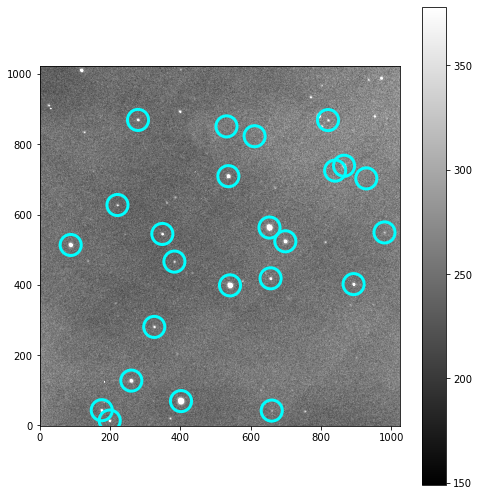

     xcentroid   ycentroid       mag
3   401.540133   69.337320 -4.433149
14  653.252875  563.110408 -4.164148
6   540.954885  398.615222 -3.759836
10   87.638044  513.516862 -2.321025
17  536.301204  709.272770 -2.185638
11  698.359241  523.955802 -2.071115
19  865.456397  738.961143 -2.040393
4   260.173777  127.618002 -1.841937
7   892.600427  402.130010 -1.299645
2   176.050225   43.414701 -0.933158
22  279.209249  869.264423 -0.930196
12  348.390529  544.872136 -0.887109
8   656.389553  418.641413 -0.707761
0   198.683434   13.933639 -0.671239
5   325.417480  280.404467 -0.373826
15  220.774910  627.211338 -0.255336
9   382.785055  466.265324 -0.192096
16  928.769926  702.883596 -0.087006
1   659.673757   42.340983 -0.070501
23  819.847502  868.824215 -0.061805
20  610.936378  822.928649 -0.046673
18  840.005061  725.063642 -0.028745
13  980.479402  549.180514 -0.001477
21  531.023655  850.903471 -0.000710
Point RA 23 41 50
Point Dec +44 10 46
objcoord <SkyCoord (ICRS): (ra, dec) 

/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/plateSolve.py:298: RuntimeWarning: divide by zero encountered in double_scalars
  scalex = 1.0/(dxfit[1]/np.cos(anglex))
/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/plateSolve.py:299: RuntimeWarning: divide by zero encountered in double_scalars
  scaley = 1.0/(dyfit[2]/np.cos(angley))
/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/plateSolve.py:301: RuntimeWarning: invalid value encountered in double_scalars
  fracanglediff = np.abs((anglex - angley)/anglex)
/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/plateSolve.py:302: RuntimeWarning: invalid value encountered in double_scalars
  fracscalediff = np.abs((scalex-scaley)/scalex)


In [32]:
import plateSolve
pathlist = Path(data_red).glob('**/*R.fit')

for path in pathlist:
    #show_image(Rimage)
    Rimage = ccdp.CCDData.read(path, unit="adu")
    
    check = plateSolve.autoSolve(path,Rimage, verbose = 1)
    if (check == True):
        #print(check)
        print(Rimage.header['JD-HELIO'])
        print("______________________________________________")
        
    else:
        print("Plate solve did not work for", path)
        print("______________________________________________")

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
942.5525843388073 144.94892649759998
475.90534719370226 1368.7634611232713


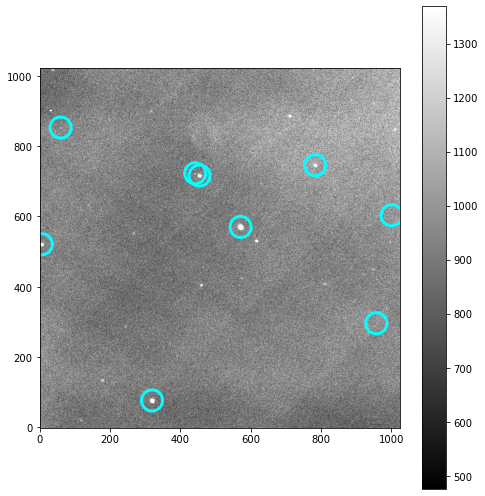

     xcentroid   ycentroid       mag
3   571.103070  570.246336 -2.722923
0   319.132017   76.694247 -1.686792
8    59.031287  852.985682 -0.602777
5   454.251839  716.382746 -0.591291
2     5.514023  521.026174 -0.523081
7   783.174032  745.716437 -0.481219
6   442.010788  723.023732 -0.057430
1   957.223714  296.159928 -0.043733
4  1000.860471  603.627684 -0.008361
Point RA 23 41 55
Point Dec +44 10 46
objcoord <SkyCoord (ICRS): (ra, dec) in deg
    (355.47916667, 44.17944444)>
radecstr 355.479 44.1794
Search radius = 0.13106342470013851 deg
        ra                dec         phot_bp_mean_mag
       deg                deg               mag       
------------------ ------------------ ----------------
 355.5019035183828 44.198035374175014        10.688043
355.45682608764184   44.1091497298546        10.973479
355.64099415478967  44.12772121179612        11.496982
 355.3306982581766   44.2359279272418        11.909237
355.50456763922585  44.06754318511075        12.128365
355.479993

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


Return code: 0 


dxfit [4.62180124e+02 1.61569634e+00 1.99434699e-01]
dyfit [ 4.73661794e+02 -1.99714003e-01  1.61492243e+00]

scalex, scaley: 0.6142662735194642 0.6145432862533335
anglex, angley: -7.036753660968596 -7.049852376223546
fracdiffs: 0.0018614713383538991 0.00045096523415198936

# Created by grmatch 0.9e0 (fi: 0.9.4)
# Invoked command: /home/idies/workspace/Storage/madisonleblanc/persistent/bin/grmatch -r /home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211101/Reduced_Images/BDF_HHAnd-001B.gaia.proj -i /home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211101/Reduced_Images/BDF_HHAnd-001B.stars.csv -o /home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211101/Reduced_Images/BDF_HHAnd-001B.match.csv --match-points --col-ref 4,5 --col-inp 2,3 --output-transformation /home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211101/Reduced_Images/BDF_HHAnd-001B.match.transform

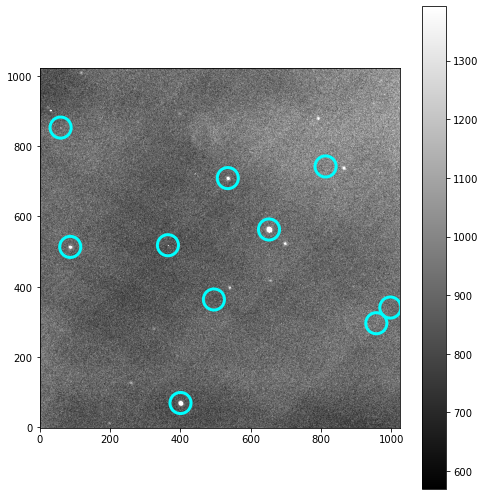

    xcentroid   ycentroid       mag
6  651.855384  563.050882 -2.228751
0  400.080023   69.336810 -1.303271
5  364.329182  518.225945 -0.913449
9   58.996488  852.955373 -0.600013
7  534.635369  709.196614 -0.516445
4   86.407503  513.467485 -0.228282
8  812.872969  742.368848 -0.104908
2  997.101363  340.969039 -0.041105
3  495.183717  363.853949 -0.039382
1  957.213141  296.331510 -0.009218
Point RA 23 41 50
Point Dec +44 10 46
objcoord <SkyCoord (ICRS): (ra, dec) in deg
    (355.45833333, 44.17944444)>
radecstr 355.458 44.1794
Search radius = 0.13106342470013851 deg
        ra                dec         phot_bp_mean_mag
       deg                deg               mag       
------------------ ------------------ ----------------
 355.5019035183828 44.198035374175014        10.688043
355.45682608764184   44.1091497298546        10.973479
 355.3306982581766   44.2359279272418        11.909237
355.50456763922585  44.06754318511075        12.128365
355.47999369869643 44.170596761287726  

/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/plateSolve.py:298: RuntimeWarning: divide by zero encountered in double_scalars
  scalex = 1.0/(dxfit[1]/np.cos(anglex))
/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/plateSolve.py:299: RuntimeWarning: divide by zero encountered in double_scalars
  scaley = 1.0/(dyfit[2]/np.cos(angley))
/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/plateSolve.py:301: RuntimeWarning: invalid value encountered in double_scalars
  fracanglediff = np.abs((anglex - angley)/anglex)
/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/plateSolve.py:302: RuntimeWarning: invalid value encountered in double_scalars
  fracscalediff = np.abs((scalex-scaley)/scalex)


In [34]:
import plateSolve
pathlist = Path(data_red).glob('BDF_HHAnd-*B.fit')

for path in pathlist:
    #show_image(Rimage)
    Bimage = ccdp.CCDData.read(path, unit="adu")
    
    check = plateSolve.autoSolve(path,Bimage, verbose = 1)
    if (check == True):
        #print(check)
        print(Bimage.header['JD-HELIO'])
        print("______________________________________________")
        
    else:
        print("Plate solve did not work for", path)
        print("______________________________________________")

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
653.4537802157614 78.66983656184308
449.9578985059893 882.1430833188049


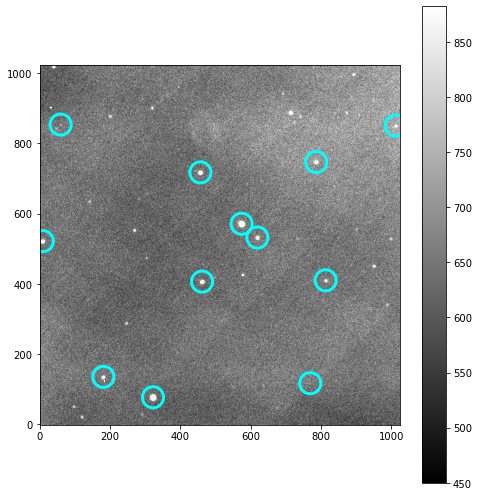

      xcentroid   ycentroid       mag
7    573.821185  570.845352 -3.184668
0    321.959138   77.245635 -2.962222
3    461.472453  406.331413 -1.396968
5      8.180480  521.458780 -1.222814
8    456.745272  717.075221 -1.205316
9    786.191382  746.472122 -0.947929
6    618.867632  531.646514 -0.851837
11    59.048262  853.066619 -0.664105
2    180.611715  135.249682 -0.293067
4    813.100709  409.862753 -0.244141
10  1012.149724  850.140628 -0.198574
1    769.200871  117.192620 -0.087119
Point RA 23 41 55
Point Dec +44 10 46
objcoord <SkyCoord (ICRS): (ra, dec) in deg
    (355.47916667, 44.17944444)>
radecstr 355.479 44.1794
Search radius = 0.13106342470013851 deg
        ra                dec         phot_g_mean_mag
       deg                deg               mag      
------------------ ------------------ ---------------
355.45682608764184   44.1091497298546        10.34314
355.47999369869643 44.170596761287726       10.365541
 355.5019035183828 44.198035374175014       10.528759
35

/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/plateSolve.py:298: RuntimeWarning: divide by zero encountered in double_scalars
  scalex = 1.0/(dxfit[1]/np.cos(anglex))
/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/plateSolve.py:299: RuntimeWarning: divide by zero encountered in double_scalars
  scaley = 1.0/(dyfit[2]/np.cos(angley))
/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/plateSolve.py:301: RuntimeWarning: invalid value encountered in double_scalars
  fracanglediff = np.abs((anglex - angley)/anglex)
/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/plateSolve.py:302: RuntimeWarning: invalid value encountered in double_scalars
  fracscalediff = np.abs((scalex-scaley)/scalex)
INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
635.5374305651957 76.09325946577133
401.3507222858389 875.6563736949734


In [ ]:
import plateSolve
pathlist = Path(data_red).glob('BDF_HHAnd-*V.fit')

for path in pathlist:
    #show_image(Rimage)
    Vimage = ccdp.CCDData.read(path, unit="adu")
    
    check = plateSolve.autoSolve(path,Vimage, verbose = 1)
    if (check == True):
        #print(check)
        print(Vimage.header['JD-HELIO'])
        print("______________________________________________")
        
    else:
        print("Plate solve did not work for", path)
        print("______________________________________________")